# **Overview**

This Jupyter Notebook details the development of a machine learning model for celebrity face recognition. The project utilizes TensorFlow, Keras, and other Python libraries to process and classify images into distinct celebrity categories. It encompasses data preprocessing, model creation with advanced techniques like ensemble learning, and thorough evaluation of the model's performance. This comprehensive guide is structured to facilitate easy understanding and replication of the processes for educational or development purposes.

# Preprocessing

## Initialize Environment and Import Libraries


Setting the working directory, we import necessary libraries for image handling (OpenCV), data manipulation (NumPy), visualization (Matplotlib), and machine learning (TensorFlow). This prepares our environment with all the tools required for data processing and model building.

In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
ls

drive/  sample_data/


In [3]:
cd drive/MyDrive/AI/ML-Fall2023/project/github

/content/drive/MyDrive/AI/ML-Fall2023/project/github


In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import sys
import random
from sklearn.utils import shuffle
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, GlobalAveragePooling2D, Concatenate, Input
from collections import Counter
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from concurrent.futures import ThreadPoolExecutor, wait
from functools import partial
from tensorflow.keras.applications import ResNet50, InceptionV3, MobileNetV2
from tensorflow.keras.preprocessing import image


## Set Up Data Handling and Loading

Define target dimensions for the images and prepare structures to hold the image data and labels. We also establish a mapping between celebrity names and numerical labels to facilitate classification.

In [6]:
target_width, target_height = 224, 224
dataset_folder = 'dataset'
images = []
labels = []
celebrity_folders = [folder for folder in os.listdir(dataset_folder) if os.path.isdir(os.path.join(dataset_folder, folder))]
celebrity_to_label = {celebrity: idx for idx, celebrity in enumerate(celebrity_folders)}
label_to_celebrity = {idx: celebrity for celebrity, idx in celebrity_to_label.items()}

In [7]:
print(celebrity_folders)
print(celebrity_to_label)

['Ali_Daei', 'Alireza_Beiranvand', 'Bahram_Radan', 'Ebi', 'Golshifteh_Farahani', 'Hayedeh', 'Homayoon_Shajarian', 'Javad_Razavian', 'Mehran_Ghafoorian', 'Mehran_Modiri', 'Mohamad_Esfehani', 'Reza_Attaran', 'Sahar_Dolatshahi', 'Seyed_Jalal_Hosseini', 'Taraneh_Alidoosti', 'Googoosh', 'Mohsen_Chavoshi', 'Mahan_Veisi']
{'Ali_Daei': 0, 'Alireza_Beiranvand': 1, 'Bahram_Radan': 2, 'Ebi': 3, 'Golshifteh_Farahani': 4, 'Hayedeh': 5, 'Homayoon_Shajarian': 6, 'Javad_Razavian': 7, 'Mehran_Ghafoorian': 8, 'Mehran_Modiri': 9, 'Mohamad_Esfehani': 10, 'Reza_Attaran': 11, 'Sahar_Dolatshahi': 12, 'Seyed_Jalal_Hosseini': 13, 'Taraneh_Alidoosti': 14, 'Googoosh': 15, 'Mohsen_Chavoshi': 16, 'Mahan_Veisi': 17}


then, we load images from the dataset, resize them to the target dimensions, and associate them with their corresponding labels. As loading this dataset can be time consuming to search each dir, its process is efficiently handled using **multi-threading** to speed up the data loading phase using parallel loading!.

In [8]:
def load_and_resize_image(image_path, target_width, target_height, celebrity_to_label):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (target_width, target_height))
    label = celebrity_to_label[os.path.basename(os.path.dirname(image_path))]
    return image, label

num_threads = 8
with ThreadPoolExecutor(max_workers=num_threads) as executor:
    load_resize_partial = partial(load_and_resize_image, target_width=target_width, target_height=target_height, celebrity_to_label=celebrity_to_label)
    results = list(executor.map(load_resize_partial, [os.path.join(dataset_folder, celebrity_folder, image_name) for celebrity_folder in celebrity_folders for image_name in os.listdir(os.path.join(dataset_folder, celebrity_folder))]))

images, labels = zip(*results)
images = list(images)
labels = list(labels)


In [9]:
label_to_celebrity

{0: 'Ali_Daei',
 1: 'Alireza_Beiranvand',
 2: 'Bahram_Radan',
 3: 'Ebi',
 4: 'Golshifteh_Farahani',
 5: 'Hayedeh',
 6: 'Homayoon_Shajarian',
 7: 'Javad_Razavian',
 8: 'Mehran_Ghafoorian',
 9: 'Mehran_Modiri',
 10: 'Mohamad_Esfehani',
 11: 'Reza_Attaran',
 12: 'Sahar_Dolatshahi',
 13: 'Seyed_Jalal_Hosseini',
 14: 'Taraneh_Alidoosti',
 15: 'Googoosh',
 16: 'Mohsen_Chavoshi',
 17: 'Mahan_Veisi'}

let's check our data info 🤔

In [11]:
print(len(images))
print(label_to_celebrity[labels[0]])
print(images[0].shape)


1134
Ali_Daei
(224, 224, 3)


## Display Sample Images

To ensure that images are loaded and labeled correctly, display a few sample images. This visual confirmation is helpful for verifying the integrity of the preprocessing steps.

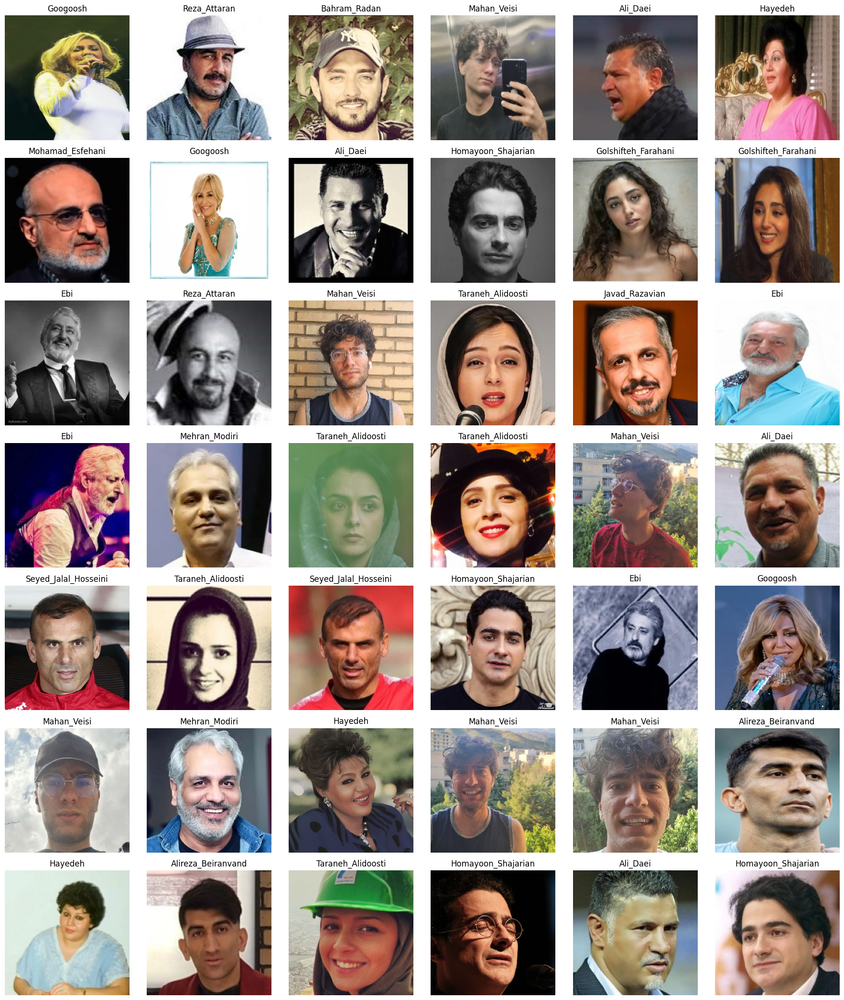

In [30]:
num_images_to_display = 42
rows, cols = 7, 6
display_indices = np.random.choice(len(images), num_images_to_display, replace=False)
fig, axes = plt.subplots(rows, cols, figsize=(18, 21))  # Adjust the figure size

for i, idx in enumerate(display_indices):
    image = images[idx]
    label = labels[idx]
    celebrity_name = label_to_celebrity[label]

    ax = axes[i // cols, i % cols]
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_title(celebrity_name)
    ax.axis('off')

plt.tight_layout()
plt.show()

As you can see, the images are not only focused and **cropped** on the faces but also include various **poses**, adding to the **complexity**. 🙂

The dataset poses a significant challenge due to the variability in the images of each person. For example, some individuals are depicted wearing **glasses** in certain images but not in others. Additionally, variations include the presence or absence of **beards**, different **hairstyles** (long and short), and the use of accessories like **caps** or **hats**.
On the other hand, identifying women wearing **scarves** can be particularly difficult as the scarves obscure some facial identifiers. These variations make the task of identifying individuals more complex. ⚡

## Split Data into Training, Validation, and Test Sets -- Visualize Data Distribution

Divide the dataset into training, validation, and test sets to ensure the model is trained, validated, and tested on distinct data samples. **Stratified** sampling maintains the distribution of classes across these sets.


In [31]:
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.15, random_state=10, stratify=labels)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=10, stratify=y_temp)


then Plot the distribution of class labels in the original dataset and each split to confirm uniformity across training, validation, and test datasets.

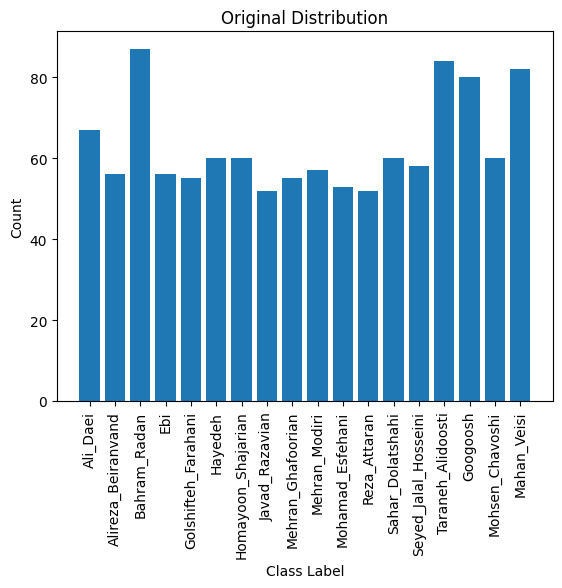

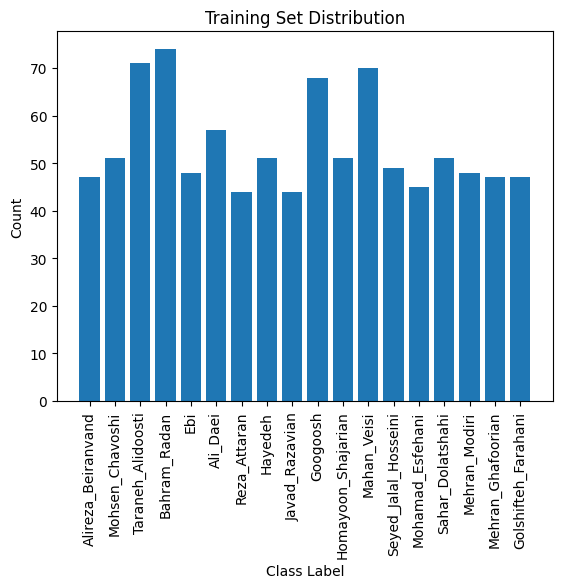

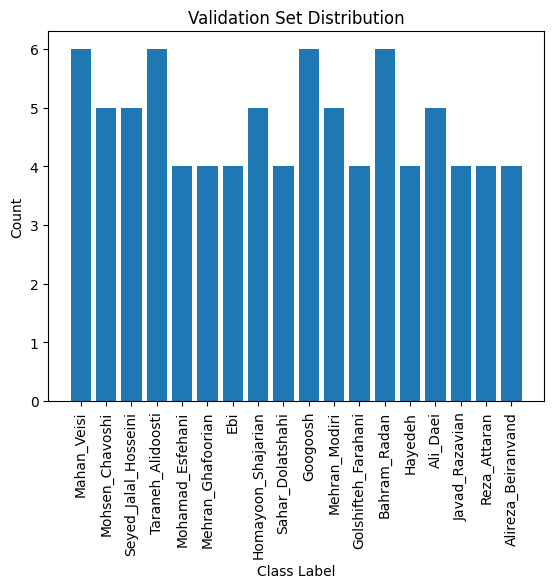

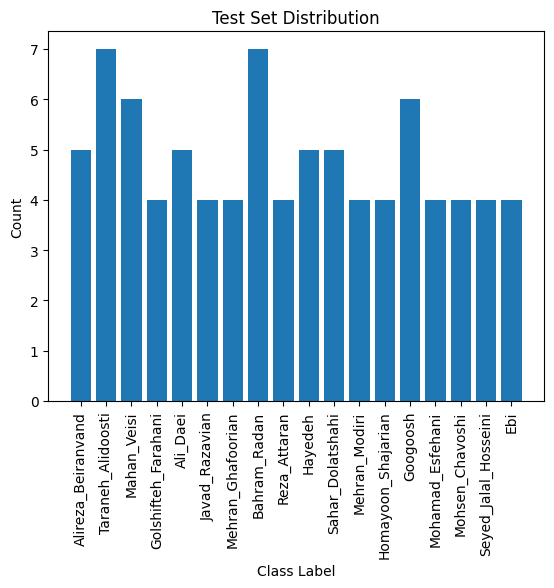

In [33]:
import matplotlib.pyplot as plt
from collections import Counter

# Assuming labels, y_train, y_val, y_test, and label_to_celebrity are already defined

original_distribution = Counter(labels)
training_distribution = Counter(y_train)
validation_distribution = Counter(y_val)
test_distribution = Counter(y_test)

def plot_distribution(class_distribution, title, label_to_celebrity):
    classes, counts = zip(*class_distribution.items())
    class_names = [label_to_celebrity[cls] for cls in classes]
    plt.bar(class_names, counts)
    plt.title(title)
    plt.xlabel('Class Label')
    plt.ylabel('Count')
    plt.xticks(rotation=90)  # Rotate x labels for better readability if they are long
    plt.show()

plot_distribution(original_distribution, 'Original Distribution', label_to_celebrity)
plot_distribution(training_distribution, 'Training Set Distribution', label_to_celebrity)
plot_distribution(validation_distribution, 'Validation Set Distribution', label_to_celebrity)
plot_distribution(test_distribution, 'Test Set Distribution', label_to_celebrity)


## **Data Augmentation and Storage**

This section deals with augmenting the training images to increase the diversity of the dataset, which can help the model generalize better. The augmented images are saved along with the original images in a structured directory format for easy access.


#### Image Augmentation


The `ImageDataGenerator` from Keras is used to perform various augmentations such as rotations, shifts, shearing, flipping, and brightness adjustments. These augmentations help create a more robust model by simulating different scenarios the model might encounter in real-world data.

In [34]:
datagen1 = ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.30,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.8, 1.2]
)

augmented_dir = 'augmented_dataset_final2'
num_augmentations = 2

def augment_image1(image, color_augmentation=False):
    if color_augmentation:

        image = tf.convert_to_tensor(image, dtype=tf.float32)
        image = tf.image.random_hue(image, 0.1)
        image = tf.image.random_saturation(image, 0.8, 1.2)
        image = tf.image.random_brightness(image, 0.1)
        image = tf.image.random_contrast(image, 0.8, 1.2)

        image = image.numpy()

    image = datagen1.random_transform(image)

    return image

### **Directory Setup for Augmented Images**


The augmented images will be stored in a directory called `augmented_dataset_final2`, where each image will have its own subdirectory labeled with its class and an index.

In [ ]:
os.makedirs(augmented_dir)
for i, original_image in enumerate(X_train):
    subdirectory = os.path.join(augmented_dir, f'img_{y_train[i]}_{i}')
    os.makedirs(subdirectory)
    original_image_filename = os.path.join(subdirectory, f'original.jpg')
    cv2.imwrite(original_image_filename, cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR))

    augmented_image = augment_image1(original_image, color_augmentation=True)
    augmented_filename = os.path.join(subdirectory, f'augmented_{0}.jpg')
    cv2.imwrite(augmented_filename, cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR))


### **Display some augmented images among their original version in the `train_set`**

In [ ]:
def display_original_and_augments(image_folder, num_samples=5):
    fig, axes = plt.subplots(num_samples, 2, figsize=(15, 5 * num_samples))  # Adjust figsize as needed

    for i in range(num_samples):
        # Randomly pick a directory
        subfolder = np.random.choice(os.listdir(image_folder))
        subfolder_path = os.path.join(image_folder, subfolder)
        image_files = os.listdir(subfolder_path)

        for j, fname in enumerate(sorted(image_files)):  # Assuming 'original.jpg', 'augmented_0.jpg'
            image_path = os.path.join(subfolder_path, fname)
            image = cv2.imread(image_path)

            ax = axes[i, j]
            ax.imshow(image)
            ax.set_title(f"{subfolder.split('_')[0]} - {'Original' if 'original' in fname else 'Augmented'}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

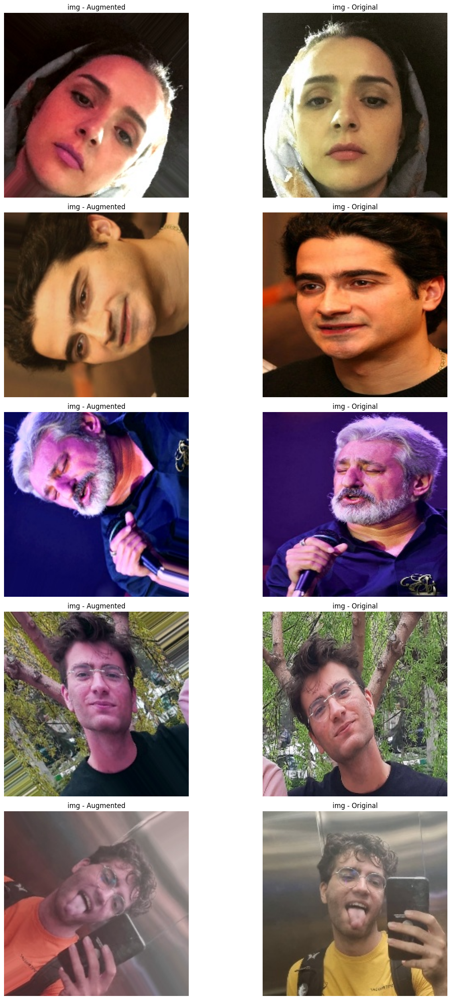

In [63]:
# Call the function with the augmented directory path
display_original_and_augments(augmented_dir, num_samples=5)


### **Load and Process Augmented Images**

After augmenting and saving the images, this section defines functions to load and preprocess them from storage, preparing them for model training. This ensures that all images, both original and augmented, are properly loaded into the training set.

In [ ]:
def load_image(file_path):
    image = cv2.imread(file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def process_image(celebrity_dir, filename):
    file_path = os.path.join(augmented_dir, celebrity_dir, filename)
    label = int(celebrity_dir.split('_')[1])
    X_train.append(load_image(file_path))
    y_train.append(label)

In [ ]:
X_train = []
y_train = []

for celebrity_dir in os.listdir(augmented_dir):
    with ThreadPoolExecutor() as executor:
        futures = [executor.submit(process_image, celebrity_dir, filename)
                   for filename in os.listdir(os.path.join(augmented_dir, celebrity_dir))]
        wait(futures)

X_train = np.array(X_train)
y_train = np.array(y_train)


Before training, the training data is shuffled to ensure that the training process does not get biased by any order in the data. Additionally, color format transformations are applied to ensure all images are in the RGB format.

In [65]:
X_train, y_train = shuffle(X_train, y_train, random_state=42)
for i in range(len(X_train)):
    # Convert BGR to RGB
    X_train[i] = cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB)
for i in range(len(X_val)):
    # Convert BGR to RGB
    X_val[i] = cv2.cvtColor(X_val[i], cv2.COLOR_BGR2RGB)
for i in range(len(X_test)):
    # Convert BGR to RGB
    X_test[i] = cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB)

## **Display Sample Images from Each Set**

Visual confirmation of the data in training, validation, and test sets is provided by displaying sample images. This step helps in verifying that the images are ready for model input after all transformations.

train:


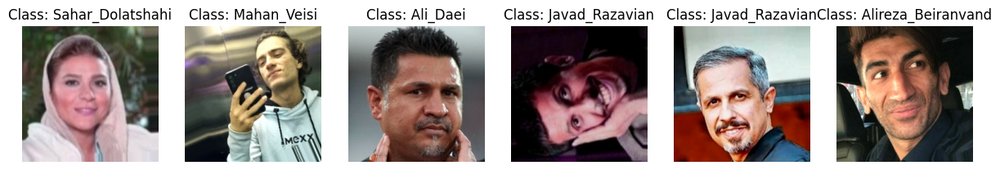

val:


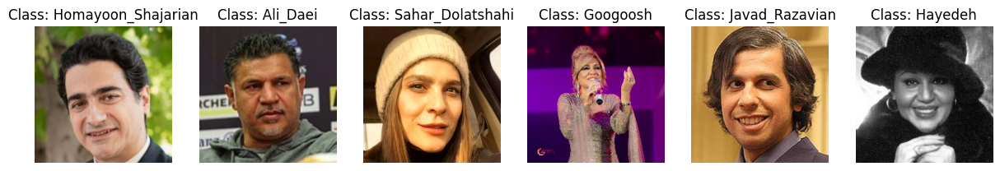

test:


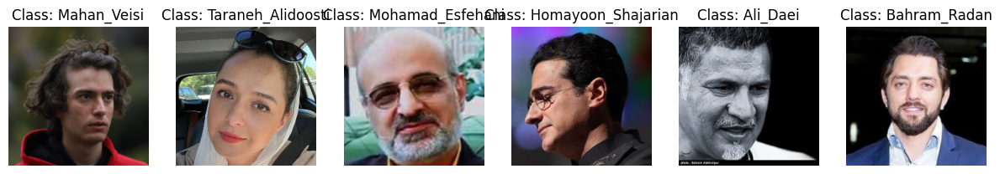

In [76]:
num_samples_to_display = 6
print("train:")
fig, axes = plt.subplots(1, num_samples_to_display, figsize=(15, 3))
for i in range(num_samples_to_display):
    index = np.random.randint(0, len(X_train))
    axes[i].imshow(X_train[index])
    axes[i].set_title(f'Class: {label_to_celebrity[y_train[index]]}')
    axes[i].axis('off')
plt.show()

print("val:")
fig, axes = plt.subplots(1, num_samples_to_display, figsize=(15, 3))
for i in range(num_samples_to_display):
    index = np.random.randint(0, len(X_val))
    axes[i].imshow(X_val[index])
    axes[i].set_title(f'Class: {label_to_celebrity[y_val[index]]}')
    axes[i].axis('off')
plt.show()

print("test:")
fig, axes = plt.subplots(1, num_samples_to_display, figsize=(15, 3))
for i in range(num_samples_to_display):
    index = np.random.randint(0, len(X_test))
    axes[i].imshow(X_test[index])
    axes[i].set_title(f'Class: {label_to_celebrity[y_test[index]]}')
    axes[i].axis('off')
plt.show()

## **Resize and Normalize Images**

Resizing the images to a fixed size ensures that they can be input into the neural network. Normalization (scaling pixel values to [0,1]) helps in faster convergence during training.

In [77]:
target_size = (224, 224)
num_classes = len(label_to_celebrity)

X_train_resized = [tf.image.resize(image, target_size) for image in X_train]
X_train_resized = np.array(X_train_resized)

X_val_resized = [tf.image.resize(image, target_size) for image in X_val]
X_val_resized = np.array(X_val_resized)

X_test_resized = [tf.image.resize(image, target_size) for image in X_test]
X_test_resized = np.array(X_test_resized)

print(X_train_resized.shape)
print(X_train_resized[1].shape)

X_train = X_train_resized / 255.0
X_val = X_val_resized / 255.0
X_test = X_test_resized / 255.0

del X_train_resized
del X_val_resized
del X_test_resized

y_train = to_categorical(y_train, num_classes=num_classes)
y_val = to_categorical(y_val, num_classes=num_classes)
y_test = to_categorical(y_test, num_classes=num_classes)

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

print(y_train.shape)
print(y_val.shape)
print(y_test.shape)


(1926, 224, 224, 3)
(224, 224, 3)
(1926, 224, 224, 3)
(85, 224, 224, 3)
(86, 224, 224, 3)
(1926, 18)
(85, 18)
(86, 18)
